In [1]:
import os
import pandas as pd
import tensorflow_hub as hub
import tensorflow as tf
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from tqdm.notebook import tqdm # 반복문의 진행상황 확인하는 모듈
import time
from scipy.spatial import distance

# 경고끄기 (option)
import warnings
warnings.filterwarnings('ignore')

In [2]:
model_url = "https://tfhub.dev/google/experts/bit/r50x1/in21k/object/1"

IMAGE_SHAPE = (224, 224)

layer = hub.KerasLayer(model_url, input_shape=IMAGE_SHAPE+(3,))
model = tf.keras.Sequential([layer])
model.summary()

Metal device set to: Apple M1 Pro


2022-09-06 16:53:54.689698: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2022-09-06 16:53:54.689824: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 2048)              23500352  
                                                                 
Total params: 23,500,352
Trainable params: 0
Non-trainable params: 23,500,352
_________________________________________________________________


In [3]:
model.build([None, 244, 244, 3]) # input shape 정의

model_name = model_url.split('/')[4] + '_' + model_url.split('/')[5]
model_name = 'r50x1_object_fine_tuning'
# 모델이름이 제대로 안나오면 model_name = '모델명'으로 수정해주세요~

In [5]:
category = 'book'
image_path = f"../crops/{category}/"
output_path = f"../vector_frame/{category}/"
if not category in os.listdir(output_path[:15]): # vector_frame에 카테고리 폴더 없으면 생성
    os.mkdir(f"../vector_frame/{category}" )

In [6]:
def extract(file):
    file = Image.open(file).convert('RGB').resize(IMAGE_SHAPE)
    file = np.array(file)/255.0 # 정규화

    embedding = model.predict(file[np.newaxis, ...])
    feature_np = np.array(embedding)
    flattened_feature = feature_np.flatten()

    return flattened_feature

In [7]:
extract('./test/test_book.jpeg')

2022-09-06 16:54:57.779245: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2022-09-06 16:54:57.905961: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 2s 2s/step


array([1.7097579 , 0.        , 1.8664591 , ..., 0.04233545, 0.22583823,
       1.4591776 ], dtype=float32)

In [9]:
def make_dataframe(category=category, model_name=model_name):
    global image_path
    global output_path
    file_list = os.listdir(image_path)
    file_list_img = [file for file in file_list if file.endswith(".png") or file.endswith(".jpeg") or file.endswith(".jpg")]
    tmp_df = pd.DataFrame()
    for i, img in enumerate(tqdm(file_list_img)):
        output = extract(image_path+'/'+img)
        tmp_df = tmp_df.append({'filename':img, 'output':output}, ignore_index=True)

    np.save(output_path+f'{category}_filename({model_name}).npy', tmp_df['filename'])
    np.save(output_path+f'{category}_output({model_name}).npy', tmp_df['output']) # np.array배열 형태로 나중에 불러오기 위해 따로 저장

In [10]:
make_dataframe()

  0%|          | 0/163 [00:00<?, ?it/s]

1/1 [==============================] - 0s 44ms/step


In [11]:
def get_dataframe(category=category, model_name=model_name):
    global output_path    
    tmp_filename = np.load(output_path+f'{category}_filename({model_name}).npy', allow_pickle=True)
    tmp_output = np.load(output_path+f'{category}_output({model_name}).npy', allow_pickle=True)
    df = pd.DataFrame({'filename':tmp_filename, 'output':tmp_output})
    return df

In [12]:
get_dataframe()

,filename,output
0,V0001519H05130008-1.jpg,"[0.5655793, 0.0, 8.108891, 1.3887715, 1.046298..."
1,V0002164H03200010-17.jpg,"[0.07374493, 0.0, 0.8802658, 0.0, 0.86504346, ..."
2,V0000339H08220016-1.jpg,"[1.1831135, 0.0, 4.5101852, 3.2181172, 0.71779..."
3,F2022042800001942-1.jpg,"[0.21550548, 0.0, 4.4019594, 5.03145, 0.766045..."
4,V0000336H07280012-1.jpg,"[0.0018489336, 0.0, 1.6297086, 6.612301, 0.0, ..."
...,...,...
158,V0002108H06010016-13.jpg,"[0.52678436, 0.0, 1.3185639, 0.85493535, 5.664..."
159,F2022053000001276-12.jpg,"[0.07966241, 0.0, 8.746162, 1.3343619, 0.26323..."
160,F2022062300002416-1.jpg,"[0.11703499, 0.0, 4.165979, 0.0301751, 0.0, 4...."
161,V0002108H06010016-12.jpg,"[2.562085, 0.0, 1.41378, 0.7178991, 3.310479, ..."


In [14]:
def get_cos_sim(file, category=category, metric='cosine'):
    before_time = time.time()
    file2vec = extract(file) # 이미지 벡터화
    df = get_dataframe() # 데이터프레임 가져오기
    df = df.append({'filename':file, 'output':file2vec}, ignore_index=True)
    
    cos_sim_array = np.zeros((len(df)))
    
    for i in range(0, len(df)):
        cos_sim_array[i] = distance.cdist([file2vec] , [df.iloc[i, 1]], metric)[0] # 벡터화된 이미지 기준
    df['cos_sim']=cos_sim_array
    after_time = time.time()
    runtime = after_time-before_time
    return df, runtime # 런타임 비교용

In [15]:
def show_sim(input_file):
    global image_path
    global output_path
    cos_sim_df, runtime = get_cos_sim(input_file)
    df_top_sim = cos_sim_df.sort_values(by='cos_sim')[:15]

    # 그래프 그리는 부분은 서비스 시 생략 가능
    f, ax = plt.subplots(3, 5, figsize=(40, 20))

    for i in range(len(df_top_sim)):
        if i == 0: 
            tmp_img = Image.open(df_top_sim.iloc[i, 0]).convert('RGB')
            title = f'Original \n{df_top_sim.iloc[i, 0]}'
        else : 
            tmp_img = Image.open(image_path+'/'+df_top_sim.iloc[i, 0]).convert('RGB')
            title = f'similarity no.{i} \n{df_top_sim.iloc[i, 0]}'

        sim = f'cos : {df_top_sim.iloc[i, 2]:.3f}' 
        ax[i//5][i%5].imshow(tmp_img, aspect='auto')
        ax[i//5][i%5].set_title(title, pad=20, size=25) # 5열짜리 표를 만드는 것이므로 단순히 5로 나눈 나머지와 몫을 사용한 것임
        ax[i//5][i%5].annotate(sim, (0,10), fontsize=18, color='red')
    
    print(f'소요시간 : {runtime:.3f}')
    plt.show()

In [16]:
def show_sim_threshold(input_file, threshold, savefig=False):
    global image_path
    global output_path
    cos_sim_df, runtime = get_cos_sim(input_file)
    df_top_sim = cos_sim_df[cos_sim_df.cos_sim < threshold].sort_values(by='cos_sim')[:30]
    # 그래프 그리는 부분은 서비스 시 생략 가능
    if len(df_top_sim) <= 10:
        f, ax = plt.subplots(2, 5, figsize=(40, 20))
    elif len(df_top_sim) <=15:
        f, ax = plt.subplots(3, 5, figsize=(40, 30))
    elif len(df_top_sim) <=20:
        f, ax = plt.subplots(4, 5, figsize=(40, 40))
    elif len(df_top_sim) <=25:
        f, ax = plt.subplots(5, 5, figsize=(40, 45))
    else:
        f, ax = plt.subplots(6, 5, figsize=(40, 50))

    for i in range(len(df_top_sim)):
        if i == 0: 
            tmp_img = Image.open(df_top_sim.iloc[i, 0]).convert('RGB')
            title = f'Original \n{df_top_sim.iloc[i, 0]}'
        else : 
            tmp_img = Image.open(image_path+'/'+df_top_sim.iloc[i, 0]).convert('RGB')
            title = f'similarity no.{i} \n{df_top_sim.iloc[i, 0]}'
        
        sim = f'cos : {df_top_sim.iloc[i, 2]:.3f}' 
        ax[i//5][i%5].imshow(tmp_img, aspect='auto')
        ax[i//5][i%5].set_title(title, pad=20, size=25) # 5열짜리 표를 만드는 것이므로 단순히 5로 나눈 나머지와 몫을 사용한 것임
        ax[i//5][i%5].annotate(sim, (0,10), fontsize=18, color='red')
    
    if savefig:
        global model_name
        plt.savefig(f'./test_result/{model_name}_test_result_{time.strftime("%H_%M_%S")}.jpg')
    print(f'소요시간 : {runtime:.3f}')
    plt.show()

1/1 [==============================] - 0s 45ms/step
소요시간 : 0.106


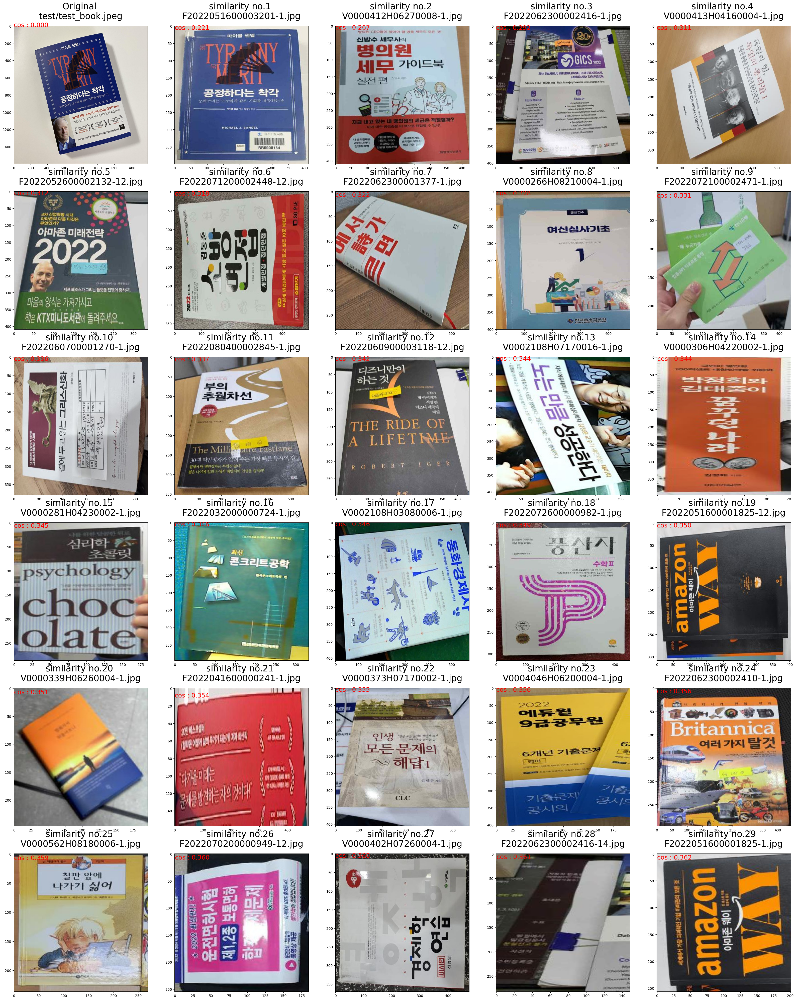

In [20]:
input_file = 'test/test_book.jpeg'
threshold = 0.5
show_sim_threshold(input_file, threshold=threshold, savefig=True)

In [19]:
def get_runtime(input_file=input_file, category=category):
    runtime_list = list()
    for i in range(100):
        df, runtime = get_cos_sim(input_file, category)
        runtime_list.append(runtime)
    runtime_mean = np.mean(runtime_list)
    print(f'100회 평균 소요시간 : {runtime_mean:.3f}초')

get_runtime()

1/1 [==============================] - 0s 42ms/step
100회 평균 소요시간 : 0.102초
